# Data Exploration and Preparation
This notebook includes the cleaning process and preparation of the CORD-19 dataset to prepare for Topic Modeling. The cleaning process is summarized as follows:
* Loading and dropping unrelated columns to the task (mainly original journal ids)
* Removing NaNs
* Deduplicating Dataset
* Examining Abstract and Title columns and removing extreme samples.
* Removing Non-English Language Titles
* Creating a smaller subset of the Data with 100,000 samples
* Removing extended stopwords
* Removing unhelpful punctuation while presevering words such as 'covid-19' and 'sars-cov-2' in tokenization process
* Lemmatization and Lowercasing
* Saving the processed dataset to csv for topic modeling


This notebook also includes the Exploratory Data Analysis (EDA). It is summarized as follows:

* Investigation of Data Sources, Journals and distribution licenses
* Visualisation of Popular Title Words
* Distribution of the number of words in each abstract and investigation of extreme tail
* Distribution of the number of words in each title and investigation of extreme tail
* Visualisation of *snipped* Distributions for Abstract and Title

# Step 1 - Data Loading and Initial Exploration

In [ ]:
#needed installations
!pip install plotly --quiet
!pip install langdetect
!pip install spacy --quiet
!pip install tqdm
!pip install swifter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 18.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993223 sha256=7d5c7c9e58dd599731a018450982dc1399b04d1a24aebdf2731284af4358a630
  Stored in directory: /root/.cache/pip/wheels/0a/f2/b2/e5ca405801e05eb7c8ed5b3b4bcf1fcabcd6272c167640072e
Successfully built langdetect
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for swifter: filename=swifter-1.4.0-py3-none-any.whl size=16505 sha256=06e3def4c8014d53a6c3efad339cda76e412f41c852751751e8b4c2ba9b0c203
  Stored in directory: /root/.cache/pip/wheels/ef/7f/bd/9bed48f078f3ee1fa75e0b29b6e0335ce1cb03a38d3443b3a3
Successfully built swifter


In [ ]:
# necessary imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import clear_output
import gdown
import gc #garbage collector - to help with possible memory issues
gc.enable()
import nltk
nltk.download('stopwords') #common words, unhelpful for Topic modeling
from nltk.corpus import stopwords
import re
import string
import ast
import spacy
nlp = spacy.load('en_core_web_sm')
#rom google.colab import drive
#drive.mount('/content/drive')
import plotly.express as px
from collections import Counter
from langdetect import detect, DetectorFactory
import random
import swifter #to increase pandas apply speed
from tqdm import tqdm #progress bar
tqdm.pandas()

#seeds for reproducibility
DetectorFactory.seed = 0
random.seed(0)
np.random.seed(0)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
#downloading dataset
file_id = "1bF7HBuC6f7rC8FmJBwzb-vQwi6m81E68"

# download
gdown.download(f"https://drive.google.com/uc?id={file_id}", "metadata.csv", quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1bF7HBuC6f7rC8FmJBwzb-vQwi6m81E68
From (redirected): https://drive.google.com/uc?id=1bF7HBuC6f7rC8FmJBwzb-vQwi6m81E68&confirm=t&uuid=da055cbb-417f-4b64-8b5f-449558eff6f4
To: /content/metadata.csv
100%|██████████| 1.65G/1.65G [00:23<00:00, 70.8MB/s]


'metadata.csv'

In [ ]:
#loading as pandas dataframe
data = pd.read_csv("metadata.csv")

<ipython-input-5-f89e8d712245>:2: DtypeWarning: Columns (1,4,5,6,13,14,15,16) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("metadata.csv")


In [ ]:
# visualize dataset
data.head(10)

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
0,ug7v899j,d1aafb70c066a2068b02786f8929fd9c900897fb,PMC,Clinical features of culture-proven Mycoplasma...,10.1186/1471-2334-1-6,PMC35282,11472636,no-cc,OBJECTIVE: This retrospective chart review des...,2001-07-04,"Madani, Tariq A; Al-Ghamdi, Aisha A",BMC Infect Dis,NaN,NaN,NaN,document_parses/pdf_json/d1aafb70c066a2068b027...,document_parses/pmc_json/PMC35282.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3...,NaN
1,02tnwd4m,6b0567729c2143a66d737eb0a2f63f2dce2e5a7d,PMC,Nitric oxide: a pro-inflammatory mediator in l...,10.1186/rr14,PMC59543,11667967,no-cc,Inflammatory diseases of the respiratory tract...,2000-08-15,"Vliet, Albert van der; Eiserich, Jason P; Cros...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/6b0567729c2143a66d737...,document_parses/pmc_json/PMC59543.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
2,ejv2xln0,06ced00a5fc04215949aa72528f2eeaae1d58927,PMC,Surfactant protein-D and pulmonary host defense,10.1186/rr19,PMC59549,11667972,no-cc,Surfactant protein-D (SP-D) participates in th...,2000-08-25,"Crouch, Erika C",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/06ced00a5fc04215949aa...,document_parses/pmc_json/PMC59549.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
3,2b73a28n,348055649b6b8cf2b9a376498df9bf41f7123605,PMC,Role of endothelin-1 in lung disease,10.1186/rr44,PMC59574,11686871,no-cc,Endothelin-1 (ET-1) is a 21 amino acid peptide...,2001-02-22,"Fagan, Karen A; McMurtry, Ivan F; Rodman, David M",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/348055649b6b8cf2b9a37...,document_parses/pmc_json/PMC59574.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
4,9785vg6d,5f48792a5fa08bed9f56016f4981ae2ca6031b32,PMC,Gene expression in epithelial cells in respons...,10.1186/rr61,PMC59580,11686888,no-cc,Respiratory syncytial virus (RSV) and pneumoni...,2001-05-11,"Domachowske, Joseph B; Bonville, Cynthia A; Ro...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/5f48792a5fa08bed9f560...,document_parses/pmc_json/PMC59580.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
5,zjufx4fo,b2897e1277f56641193a6db73825f707eed3e4c9,PMC,Sequence requirements for RNA strand transfer ...,10.1093/emboj/20.24.7220,PMC125340,11742998,green-oa,Nidovirus subgenomic mRNAs contain a leader se...,2001-12-17,"Pasternak, Alexander O.; van den Born, Erwin; ...",The EMBO Journal,NaN,NaN,NaN,document_parses/pdf_json/b2897e1277f56641193a6...,document_parses/pmc_json/PMC125340.xml.json,http://europepmc.org/articles/pmc125340?pdf=re...,NaN
6,5yhe786e,3bb07ea10432f7738413dff9816809cc90f03f99,PMC,Debate: Transfusing to normal haemoglobin leve...,10.1186/cc987,PMC137267,11299062,no-cc,Recent evidence suggests that critically ill p...,2001-03-08,"Alvarez, Gonzalo; Hébert, Paul C; Szick, Sharyn",Crit Care,NaN,NaN,NaN,document_parses/pdf_json/3bb07ea10432f7738413d...,document_parses/pmc_json/PMC137267.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1...,NaN
7,8zchiykl,5806726a24dc91de3954001effbdffd7a82d54e2,PMC,The 21st International Symposium on Intensive ...,10.1186/cc1013,PMC137274,11353930,no-cc,The 21st International Symposium on Intensive ...,2001-05-02,"Ball, Jonathan; Venn, Richard",Crit Care,NaN,NaN,NaN,document_parses/pdf_json/5806726a24dc91de39540...,document_parses/pmc_json/PMC137274.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1...,NaN
8,8qnrcgnk,faaf1022ccfe93b032c5608097a53543ba24aedb,PMC,Heme oxygenase-1 and carbon monoxide in pulmon...,10.1186/1465-9921-4-7,PMC193681,12964953,no-cc,"Heme oxygenase-1 (HO-1), an inducible stress p...",2003-08-07,"Slebos, Dirk-Jan; Ryter, Stefan W; Choi, Augus...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/faaf1022ccfe93b032c56...,document_parses/pmc_json/PMC193681.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1...,NaN
9,jg13scgo,5b44feca5d6ffaaeb6

In [ ]:
#initial exploration
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1056660 entries, 0 to 1056659
Data columns (total 19 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   cord_uid          1056660 non-null  object 
 1   sha               373766 non-null   object 
 2   source_x          1056660 non-null  object 
 3   title             1056157 non-null  object 
 4   doi               656780 non-null   object 
 5   pmcid             389571 non-null   object 
 6   pubmed_id         498932 non-null   object 
 7   license           1056660 non-null  object 
 8   abstract          821116 non-null   object 
 9   publish_time      1054846 non-null  object 
 10  authors           1032791 non-null  object 
 11  journal           969338 non-null   object 
 12  mag_id            0 non-null        float64
 13  who_covidence_id  482935 non-null   object 
 14  arxiv_id          14249 non-null    object 
 15  pdf_json_files    373766 non-null   object 
 16  

It can be seen here that the maximum number of samples we have is over 1 million. However, there are many inconsistencies and missing values that need to be addressed. As per the assesment description, which stated the project should have 100,000 data points, we will create a subset of this length. This will therefore meet the criteria of the assignemnt, reduce computational constraints such as runtime and limited access to power resources and also provide more fine-grained topics than topics created from the entire dataset. An initial LDA was performed on the entire dataset, with a slightly different cleaning process than done here, and the results will be briefly discussed in the final report. The method here applied to 100,000 samples can be expanded to the entire dataset and is left as a future extension.

In [ ]:
data.describe()

,mag_id,s2_id
count,0.0,9.764680e+05
mean,NaN,2.175871e+08
std,NaN,5.312281e+07
min,NaN,9.600000e+01
25%,NaN,2.211411e+08
50%,NaN,2.320829e+08
75%,NaN,2.373948e+08
max,NaN,2.491936e+08


As you can see, there are numerous columns. Most columns are for reference purposes or typical metadata for archival and storage purposes. We highlight the relevant columns which will be used for visualisation, and for the topic modelling task. We decided to initially keep DOI and CORD_UID to help identify duplicates in the dataset.

In [ ]:
data.drop(
    columns = ['mag_id','arxiv_id', 'pdf_json_files', 'pmc_json_files',
               'mag_id', 'who_covidence_id', 'sha','s2_id','pubmed_id','url','pmcid'], inplace=True)

data.dropna().reset_index(drop=True)

data.head(10)

,cord_uid,source_x,title,doi,license,abstract,publish_time,authors,journal
0,ug7v899j,PMC,Clinical features of culture-proven Mycoplasma...,10.1186/1471-2334-1-6,no-cc,OBJECTIVE: This retrospective chart review des...,2001-07-04,"Madani, Tariq A; Al-Ghamdi, Aisha A",BMC Infect Dis
1,02tnwd4m,PMC,Nitric oxide: a pro-inflammatory mediator in l...,10.1186/rr14,no-cc,Inflammatory diseases of the respiratory tract...,2000-08-15,"Vliet, Albert van der; Eiserich, Jason P; Cros...",Respir Res
2,ejv2xln0,PMC,Surfactant protein-D and pulmonary host defense,10.1186/rr19,no-cc,Surfactant protein-D (SP-D) participates in th...,2000-08-25,"Crouch, Erika C",Respir Res
3,2b73a28n,PMC,Role of endothelin-1 in lung disease,10.1186/rr44,no-cc,Endothelin-1 (ET-1) is a 21 amino acid peptide...,2001-02-22,"Fagan, Karen A; McMurtry, Ivan F; Rodman, David M",Respir Res
4,9785vg6d,PMC,Gene expression in epithelial cells in respons...,10.1186/rr61,no-cc,Respiratory syncytial virus (RSV) and pneumoni...,2001-05-11,"Domachowske, Joseph B; Bonville, Cynthia A; Ro...",Respir Res
5,zjufx4fo,PMC,Sequence requirements for RNA strand transfer ...,10.1093/emboj/20.24.7220,green-oa,Nidovirus subgenomic mRNAs contain a leader se...,2001-12-17,"Pasternak, Alexander O.; van den Born, Erwin; ...",The EMBO Journal
6,5yhe786e,PMC,Debate: Transfusing to normal haemoglobin leve...,10.1186/cc987,no-cc,Recent evidence suggests that critically ill p...,2001-03-08,"Alvarez, Gonzalo; Hébert, Paul C; Szick, Sharyn",Crit Care
7,8zchiykl,PMC,The 21st International Symposium on Intensive ...,10.1186/cc1013,no-cc,The 21st International Symposium on Intensive ...,2001-05-02,"Ball, Jonathan; Venn, Richard",Crit Care
8,8qnrcgnk,PMC,Heme oxygenase-1 and carbon monoxide in pulmon...,10.1186/1465-9921-4-7,no-cc,"Heme oxygenase-1 (HO-1), an inducible stress p...",2003-08-07,"Slebos, Dirk-Jan; Ryter, Stefan W; Choi, Augus...",Respir Res
9,jg13scgo,PMC,Technical Description of RODS: A Real-time Pub...,10.1197/jamia.m1345,bronze-oa,This report describes the design and implement...,2003-09-01,"Tsui, Fu-Chiang; Espino, Jeremy U.; Dato, Virg...",Journal of the American Medical Informatics As...


# Step 2 - Data Cleaning
This involves identifying and removing duplicates, missing or irrelevant data. It was later noticed that this was only applied to abstract and so this step will later be applied to the title column before topic modeling in the respective notebooks. From visual inspection it was observed that one abstract contained just
```
[Figure: see text].
```
Therefore this is also removed in the following step.

In [ ]:
# remove empty abstracts or abstracts with 'NaN'
data = data[data['abstract'] != '' ]
data = data[data['abstract'].notna()]


# remove abstract with incorrect description
data =  data[data['abstract'] != '[Figure: see text].']
data = data.reset_index(drop=True)

print(len(data))

820910


We will use doi, cord_uid and publish_time to detect and remove duplicates.

In [ ]:
# remove duplicates if they have matching dois, cord_uids and date published.
data = data.drop_duplicates(subset=['cord_uid', 'doi', 'publish_time']) #matching
print(len(data))

768399


We now have 768,399 data samples. We will keep doi, cord_uid and publish_time for now but remove before the final dataset processing.

In [ ]:
data.describe()

,cord_uid,source_x,title,doi,license,abstract,publish_time,authors,journal
count,768399,768399,768289,534099,768399,768399,766676,763649,691840
unique,764314,49,677329,533592,18,715974,7644,665191,49912
top,m1tx74tc,WHO,Conclusion,10.1016/j.resuscitation.2021.10.040,unk,[Figure: see text],2021,"Anonymous,",PLoS One
freq,30,282404,39,3,392903,166,147635,1188,9163


# Step 3 - Exploratory Data Analysis

#### 3.1.1 - Sources

In [ ]:
# sources investigation
sources = data['source_x'].str.split(';').explode().str.strip()

unique_sources = sorted(sources.unique())

print(f"Number of unique sources: {len(unique_sources)} \n")

for i in range(len(unique_sources)):
    print(f"{i+1}. {unique_sources[i]}")

Number of unique sources: 7 

1. ArXiv
2. BioRxiv
3. Elsevier
4. MedRxiv
5. Medline
6. PMC
7. WHO


There are about 7 unique sources, as mentioned in the [CORD-19 research paper](https://drive.google.com/file/d/10h8G_cdtmp3F0y2ayPiZqzVsiYpSLTET/view?usp=sharing). These are all relevant sources for any research in the medical, or healthcare field.  

#### 3.1.2 - Journals

It is important to investigate the popular journals that the data was sourced from especially if one wanted to create meaning topic labels that would work seamlessly with the journal website.

In [ ]:
# uniquue journals
unique_journal = data['journal'].unique()
print(f"Number of unique journals: {len(unique_journal)} \n")

Number of unique journals: 49913 



journal
PLoS One                           9163
bioRxiv                            8957
Int J Environ Res Public Health    8193
Sci Rep                            5467
Cureus                             4040
Front Psychol                      3329
BMJ Open                           3281
Viruses                            3151
Front Immunol                      3083
Sustainability                     2866
Name: count, dtype: int64


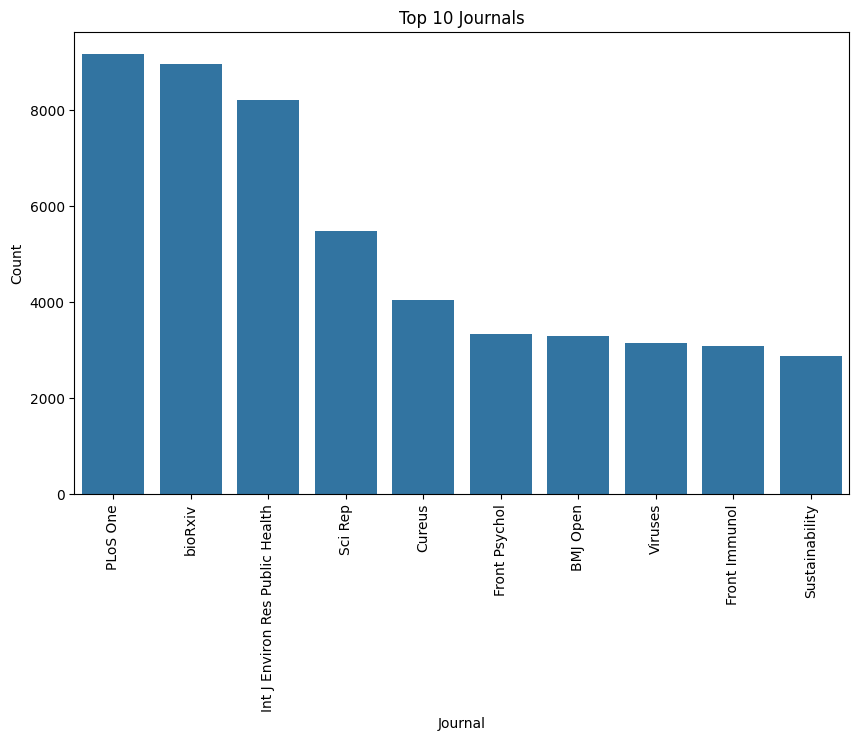

In [ ]:
# top journals
top_journals = data['journal'].value_counts().head(10)
print(top_journals)

# chart for top journals
plt.figure(figsize=(10, 6))
sns.barplot(x = top_journals.index, y = top_journals.values)
plt.xlabel('Journal')
plt.ylabel('Count')
plt.title('Top 10 Journals')
plt.xticks(rotation=90)
plt.show()

#### 3.1.3 - Licenses
As mentioned on the data card, there are many different types of licenses that may cause issues with redistributing the data and any new potential labelled datasets created from this project.

In [ ]:
# unquie license
unique_license = data['license'].unique()
print(f"Number of unique license: {len(unique_license)} \n")


for i in range(len(unique_license)):
    print(f"{i+1}. {unique_license[i]}")

Number of unique license: 18 

1. no-cc
2. green-oa
3. bronze-oa
4. cc-by
5. cc-by-nc
6. cc0
7. cc-by-nc-nd
8. gold-oa
9. cc-by-nc-sa
10. hybrid-oa
11. cc-by-nd
12. unk
13. cc-by-sa
14. els-covid
15. pd
16. arxiv
17. biorxiv
18. medrxiv


Unique Licenses

license
unk            392903
cc-by          151775
no-cc          116004
cc-by-nc        23097
els-covid       20166
medrxiv         17931
cc-by-nc-nd     16701
arxiv           13698
biorxiv          7840
cc-by-nc-sa      4457
Name: count, dtype: int64


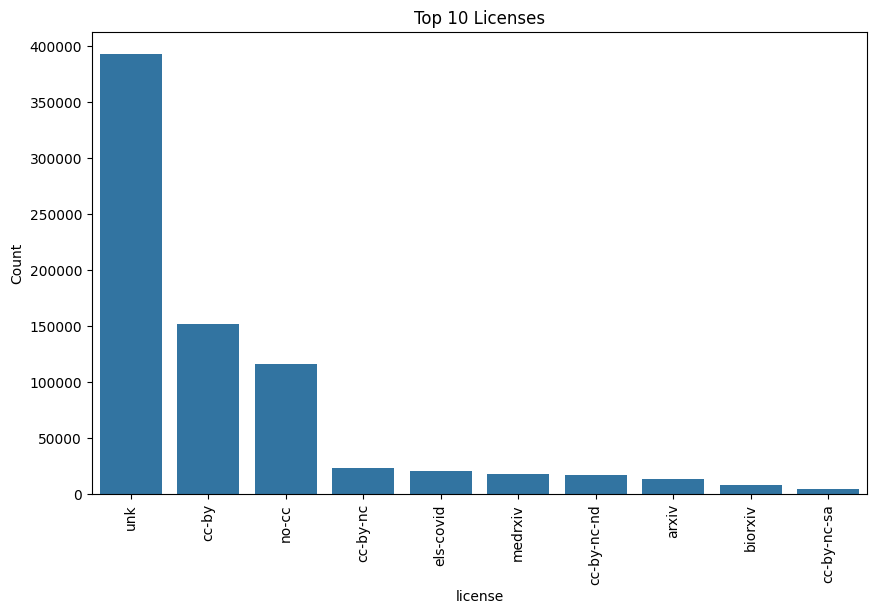

In [ ]:
# top licenses
top_licenses = data['license'].value_counts().head(10)
print(top_licenses)

# plot chart for top licenses
plt.figure(figsize=(10, 6))
sns.barplot(x=top_licenses.index, y=top_licenses.values)
plt.ylabel('Count')
plt.title('Top 10 Licenses')
plt.xticks(rotation=90)
plt.show()

For comparison, here are some common license types that are typically used in publishing papers:

Open Access:

- CC BY: Creative Commons Attribution (allows distribution and modification with attribution).
- CC BY-SA: Creative Commons Attribution-ShareAlike (requires sharing under the same license).
- CC BY-ND: Creative Commons Attribution-NoDerivatives (allows redistribution but no modification).
- CC BY-NC: Creative Commons Attribution-NonCommercial (allows non-commercial use only).

In [ ]:
# show a column without a license name
data[data['license'] == 'unk']

,cord_uid,source_x,title,doi,license,abstract,publish_time,authors,journal
12934,ns6dt05v,PMC,Infected open depressed skull fracture complic...,10.1186/s12245-021-00346-9,unk,BACKGROUND: Tetanus is a rare disease caused b...,2021-04-23,"Hakim, Dzulfikar D. L.; Faried, Ahmad; Nurhadi...",NaN
12935,glgqxiil,PMC,Genetic mechanisms and correlated risk factors...,10.1186/s13756-021-00936-5,unk,"BACKGROUND: Knowledge on the epidemiology, gen...",2021-04-23,"Ngoi, Soo Tein; Chong, Chun Wie; Ponnampalavan...",NaN
12936,vb61mqgr,PMC,Age-specific risk factors of severe pneumonia ...,10.1186/s13052-021-01042-3,unk,BACKGROUND: Risk factors that predispose the d...,2021-04-23,"Chen, Lumin; Miao, Chong; Chen, Yanling; Han, ...",NaN
35449,wjr5a0br,PMC,Tuberculosis: a timeless challenge for medicine,10.15167/2421-4248/jpmh2020.61.2.1402,unk,This overview shows how tuberculosis has repre...,2020-07-04,"ARMOCIDA, E.; MARTINI, M.",NaN
35450,yrob1nv3,PMC,Addressing Challenges Associated with Operatio...,10.1056/cat.20.0384,unk,"In a novel pandemic, health care leaders are t...",2020-08-12,"Milliken, Aimee; Jurchak, Martha; Sadovnikoff,...",NaN
...,...,...,...,...,...,...,...,...,...
820891,i93onclm,Medline; WHO,Depression and suicide among Arab adolescents:...,10.1111/jpm.12802,unk,Suicide is a global health problem that affect...,2021,"Dardas, Latefa Ali",J. psychiatr. ment. health nurs
820896,ynhhb55y,Medline; WHO,Real-time and automated monitoring of antischi...,10.1016/j.isci.2022.104087,unk,Schistosomiasis is a neglected tropical diseas...,2022,"Ravaynia, Paolo S; Biendl, Stefan; Grassi, Fra...",iScience
820897,9l02rt5i,Medline; WHO,Management of acute kidney injury associated w...,10.1097/mnh.0000000000000742,unk,PURPOSE OF REVIEW: Although initially kidney i...,2021,"Cottam, Daniel; Nadim, Mitra K; Forni, Lui G",Curr Opin Nephrol Hypertens
820898,6yz4koed,Medline; WHO,Detection and Characterization of Bacterial Bi...,10.1021/acssensors.1c02722,unk,Microbial biofilms have caused serious concern...,2022,"Funari, Riccardo; Shen, Amy Q",ACS Sens


#### 3.1.4 - Finding Popular Title words
Titles may play an important role in identifying useful topics so we will investigate them further, espcially the popular title words as they may be a useful indication of coarse-grained topics.

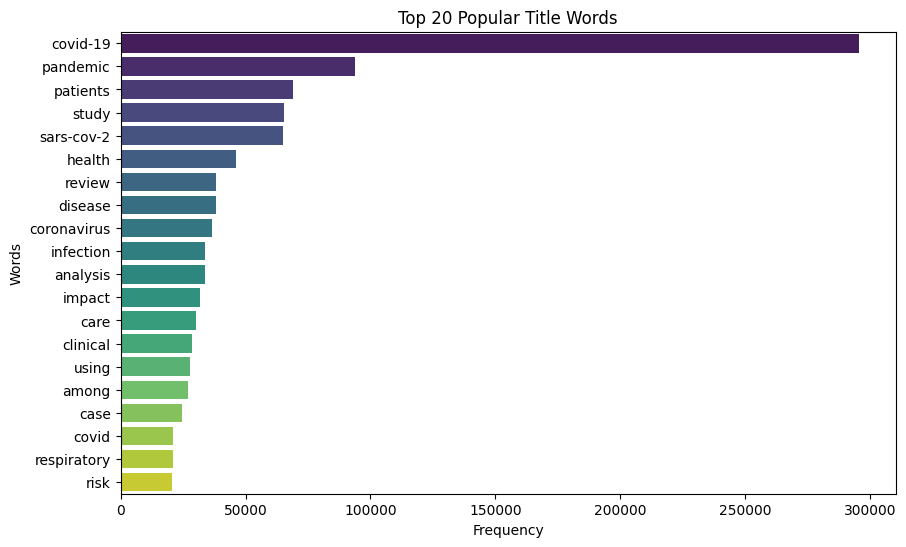

<Figure size 640x480 with 0 Axes>

In [ ]:
#download English stopords
stop_words = set(stopwords.words('english'))

#function to remove stopwords and find popular names
def popular_title_words(data, column, title, top_n=20, color="viridis", orientation="h"):
    """Removes Stopwards and finds popular title words while keeping words intact.
    Returns: plot."""

    # Text Processing
    text = " ".join(data[column].dropna().astype(str)).lower()  # Convert to string

    # Punctuation removal while keep '-' for terms like 'covid-19'
    words = re.findall(r'\b[\w\-]+\b', text)
    #text = text.replace("sars-cov-2", "covid-19").replace("covid19", "covid-19").replace("covid", "covid-19")

    # Remove stopwords
    filtered_text = [word for word in words if word not in stop_words]

    # Obtain word counts for each title
    word_counts = Counter(filtered_text)
    top_words = word_counts.most_common(top_n)  # Get top N words

    # Plotting
    words, counts = zip(*top_words)

    plt.figure(figsize=(10, 6))

    if orientation == "h":
        sns.barplot(y=list(words), x=list(counts), palette=color)
        plt.xlabel("Frequency")
        plt.ylabel("Words")
    else:
        sns.barplot(x=list(words), y=list(counts), palette=color)
        plt.xticks(rotation=45)
        plt.xlabel("Words")
        plt.ylabel("Frequency")

    plt.title(title)
    plt.show()


popular_title_words(data, 'title', 'Top 20 Popular Title Words', top_n=20, color="viridis", orientation="h")

#save image
plt.savefig('popular_title_words.png')

As expected, the popular words include terms like 'covid-19' and 'pandemic'.

#### 3.1.5 - Distributions of Title and Abstract Length
It is important to investigate the distribution of words in both abstracts and titles. We will be comparing the topics produced using just the titles, just the abstracts and both together. It is important to check that both have a consistent distribution. If some entries contained extremely long entries, this may bias the topics towards these particular papers.

Average Title Length is  104 words


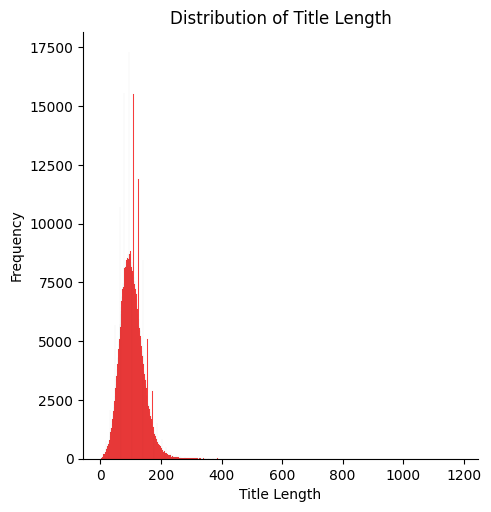

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 640x480 with 0 Axes>

In [ ]:
#Distribution of Words in the Title
data['length_title'] = data['title'].str.len() #convert to string first
average_title_length = data['length_title'].mean()
print(f"Average Title Length is {average_title_length: .0f} words")

#plotting
sns.displot(data['length_title'], color="r")
plt.title('Distribution of Title Length')
plt.xlabel('Title Length')
plt.ylabel('Frequency')
plt.show()

#save image
plt.savefig('Distribution of Title Length.png')
#download
from google.colab import files
files.download('Distribution of Title Length.png')

Average Abstract Length is 1463 words


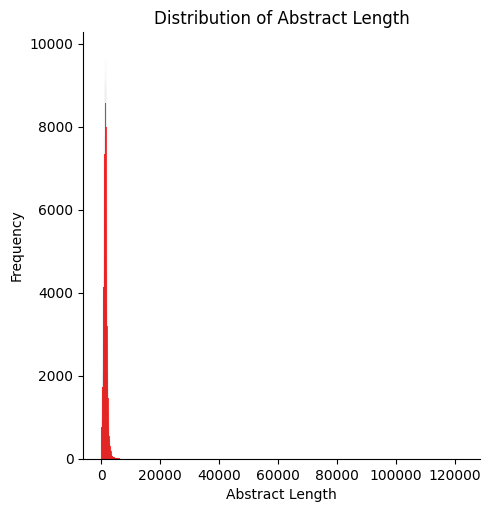

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 640x480 with 0 Axes>

In [ ]:
#Distribution of Words in the Abstract
data['abstract_length'] = data['abstract'].str.len()
average_abstract_length = data['abstract_length'].mean()
print(f"Average Abstract Length is {average_abstract_length:.0f} words")

#plotting
sns.displot(data['abstract_length'], color="r" )
plt.title('Distribution of Abstract Length') #
plt.xlabel('Abstract Length')
plt.ylabel('Frequency')
plt.show()


#save image
plt.savefig('Distribution of Abstract Length.png')
#download
from google.colab import files
files.download('Distribution of Abstract Length.png')

It can be seen that both have extreme tails and will be further investigated.

In [ ]:
#Find the minimum, maximum and most common counts for both titles and abstracts
min_title_length = data['length_title'].min()
max_title_length = data['length_title'].max()
most_common_title_length = data['length_title'].mode()[0]

min_abstract_length = data['abstract_length'].min()
max_abstract_length = data['abstract_length'].max()
most_common_abstract_length = data['abstract_length'].mode()[0]

#printing
print(f"Minimum Title Length: {min_title_length}, Maximum Title Length: {max_title_length}, Most Common Title Length: {most_common_title_length}")
print(f"Minimum Abstract Length: {min_abstract_length}, Maximum Abstract Length: {max_abstract_length}, Most Common Abstract Length: {most_common_abstract_length}")

Minimum Title Length: 2.0, Maximum Title Length: 1187.0, Most Common Title Length: 99.0
Minimum Abstract Length: 1, Maximum Abstract Length: 122392, Most Common Abstract Length: 159


We set a threshold to investigate the extreme values in the distribution

In [ ]:
#set the threshold as the extreme 1%
threshold_title = data['length_title'].quantile(0.99)
threshold_abstract = data['abstract_length'].quantile(0.99)

#create dataset for each
title_extremes = data[data['length_title'] >= threshold_title]
abstract_extremes = data[data['abstract_length'] >= threshold_abstract]

#organize by ascending
title_extremes = title_extremes.sort_values('length_title', ascending = False)
abstract_extremes = abstract_extremes.sort_values('abstract_length', ascending = False)

#print
print(len(title_extremes))
print(len(abstract_extremes))

7821
7691


In [ ]:
# remove truncation to investigate full text
pd.set_option('display.max_colwidth', None)

#investigate one sample
print(abstract_extremes[['abstract_length', 'abstract']].iloc[0])

abstract_length                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

Upon Investigation, it appears that the full article seems to be included in the abstract as it is unlikely that the any abstract has a word count of 122,392 words. Therefore we will remove these extremes to ensure a single data sample is not having too much or too little of an influence on the topic modeling. This also ensures that these extreme values will not be chosen as part of the random sample of 100,000 samples used for topic modeling.

In [ ]:
# look at the last abstract
print(abstract_extremes[['abstract_length', 'abstract']].iloc[-1])

abstract_length                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [ ]:
# lets look at titles
title_extremes.head(30)

,cord_uid,source_x,title,doi,license,abstract,publish_time,authors,journal,length_title,abstract_length
426528,1sd52oxv,WHO,"Empfehlungen zur Unterstützung von belasteten, schwerstkranken, sterbenden und trauernden Menschen in der Corona-Pandemie aus palliativmedizinischer Perspektive : Empfehlungen der Deutschen Gesellschaft für Palliativmedizin (DGP), der Deutschen Interdisziplinären Vereinigung für Intensiv- und Notfallmedizin (DIVI), des Bundesverbands Trauerbegleitung (BVT), der Arbeitsgemeinschaft für Psychoonkologie in der Deutschen Krebsgesellschaft, der Deutschen Vereinigung für Soziale Arbeit im Gesundheitswesen (DVSG) und der Deutschen Gesellschaft für Systemische Therapie, Beratung und Familientherapie (DGSF)./ [Recommendations for the support of suffering, severely ill, dying or grieving persons in the corona pandemic from a palliative care perspective : Recommendations of the German Society for Palliative Medicine (DGP), the German Interdisciplinary Association for Intensive and Emergency Medicine (DIVI), the Federal Association for Grief Counseling (BVT), the Working Group for Psycho-oncology in the German Cancer Society, the German Association for Social Work in the Healthcare System (DVSG) and the German Association for Systemic Therapy, Counseling and Family Therapy (DGSF)]",NaN,unk,"The corona pandemic has led to a number of restrictions and prohibitions, which in turn place large psychosocial or spiritual burdens on patients with COVID-19, their families and relatives and the treating personnel in the healthcare system. Patients with COVID-19 are not allowed to receive visitors and many hospitals and nursing homes have completely banned visitors. Many support services have been reduced or stopped completely. Necessary treatment interventions for other patients with critical and life-limiting diseases have been delayed or suspended in order to free resources for the expected COVID-19 patients; however, these people need to feel social connectedness with their relatives. Palliative care patients should be exempted from any ban on visitors. Families should be able to visit dying patients even on intensive care units or isolation wards, using adequate protective equipment. Alternative options, such as video telephone calls or via social media should be explored for patients in isolation. Families should also be enabled to say goodbye to the deceased with adequate protective equipment or should be offered alternative real or virtual options for remembrance and commemoration. Health care professionals coping with the exceptional stress should be continuously supported. This requires clear communication and leadership structures, communication training, psychosocial support, but most of all optimal framework conditions for the clinical work.",2020,"Münch, Urs; Müller, Heidi; Deffner, Teresa; von Schmude, Andrea; Kern, Martina; Kiepke-Ziemes, Susanne; Radbruch, Lukas",Schmerz,1187.0,1481
54873,v5qvvxai,PMC,"Aktualisierte Empfehlungen zur infektiologischen Versorgung von Flüchtlingen im Kindes- und Jugendalter in Deutschland (Stand 30. März 2022), angemeldet als S1-Leitlinie (AWMF-Register Nr. 048-017): Stellungnahme der Deutschen Gesellschaft für Pädiatrische Infektiologie e. V. (DGPI), der Gesellschaft für Tropenpädiatrie und Internationale Kindergesundheit e. V. (GTP), des Berufsverbandes der Kinder- und Jugendärzte e. V. (BVKJ) und der Deutschen Gesellschaft für Kinder- und Jugendmedizin e. V. (DGKJ), unter Mitarbeit des Berufsverbands der Ärztinnen und Ärzte des Öffentlichen Gesundheitsdienstes e. V. (BVÖGD), der Deutschen Gesellschaft für Kinderchirurgie e. V. (DGKCH), der Deutschen Gesellschaft für Gynäkologie und Geburtshilfe e. V. (DGGG), Deutsche Gesellschaft für Allgemeinmedizin und Familienmedizin (DEGAM), des Bündnis Kinder- und Jugendgesundheit e. V. (früher Deutsche Akademie für Kinder- und Jugendmedizin, DAKJ), der Deutschen Gesellschaft für Tropenmedizin, Reisemedizin und Globale Gesundheit e. V. (D

It can be seen here that many of the titles contain a translation into English from the original langauge of the paper. This explains why some of these titles are double or triple the usual length, as they include translations into one or more lanaguges. It can also be seen here that the abstract is always in English, meaning it is just the title we have to process. In some cases there are clear markers between lanaguges (e.g. [], /, {}). However, these are not consistent and vary. We therefore use lang detect to strip non English words. This was not done in the original LDA implementation and resulted in one topic exclusively being non-English, wrongly tokenized stopwrds, e.g. 'der' and 'den'.

In [ ]:
DetectorFactory.seed = 0

#function to detect English words and discard other langauges:
def english_language_finder(title):
  if pd.isnull(title):
    return ""

  #Check if the English is in the segment separators as noticed
  parts = re.split(r'[|/;–—\-{}]', title)  # Add separators as needed
  english_parts = []
  for part in parts:
      try:
          if detect(part.strip()) == 'en':
              english_parts.append(part.strip())
      except:
          continue  #skip if no other language detected
  return " / ".join(english_parts)

#apply to titles extreme to check it works
title_extremes['english_title'] = title_extremes['title'].apply(english_language_finder)

In [ ]:
title_extremes[['title', 'english_title']]

,title,english_title
426528,"Empfehlungen zur Unterstützung von belasteten, schwerstkranken, sterbenden und trauernden Menschen in der Corona-Pandemie aus palliativmedizinischer Perspektive : Empfehlungen der Deutschen Gesellschaft für Palliativmedizin (DGP), der Deutschen Interdisziplinären Vereinigung für Intensiv- und Notfallmedizin (DIVI), des Bundesverbands Trauerbegleitung (BVT), der Arbeitsgemeinschaft für Psychoonkologie in der Deutschen Krebsgesellschaft, der Deutschen Vereinigung für Soziale Arbeit im Gesundheitswesen (DVSG) und der Deutschen Gesellschaft für Systemische Therapie, Beratung und Familientherapie (DGSF)./ [Recommendations for the support of suffering, severely ill, dying or grieving persons in the corona pandemic from a palliative care perspective : Recommendations of the German Society for Palliative Medicine (DGP), the German Interdisciplinary Association for Intensive and Emergency Medicine (DIVI), the Federal Association for Grief Counseling (BVT), the Working Group for Psycho-oncology in the German Cancer Society, the German Association for Social Work in the Healthcare System (DVSG) and the German Association for Systemic Therapy, Counseling and Family Therapy (DGSF)]","[Recommendations for the support of suffering, severely ill, dying or grieving persons in the corona pandemic from a palliative care perspective : Recommendations of the German Society for Palliative Medicine (DGP), the German Interdisciplinary Association for Intensive and Emergency Medicine (DIVI), the Federal Association for Grief Counseling (BVT), the Working Group for Psycho / oncology in the German Cancer Society, the German Association for Social Work in the Healthcare System (DVSG) and the German Association for Systemic Therapy, Counseling and Family Therapy (DGSF)]"
54873,"Aktualisierte Empfehlungen zur infektiologischen Versorgung von Flüchtlingen im Kindes- und Jugendalter in Deutschland (Stand 30. März 2022), angemeldet als S1-Leitlinie (AWMF-Register Nr. 048-017): Stellungnahme der Deutschen Gesellschaft für Pädiatrische Infektiologie e. V. (DGPI), der Gesellschaft für Tropenpädiatrie und Internationale Kindergesundheit e. V. (GTP), des Berufsverbandes der Kinder- und Jugendärzte e. V. (BVKJ) und der Deutschen Gesellschaft für Kinder- und Jugendmedizin e. V. (DGKJ), unter Mitarbeit des Berufsverbands der Ärztinnen und Ärzte des Öffentlichen Gesundheitsdienstes e. V. (BVÖGD), der Deutschen Gesellschaft für Kinderchirurgie e. V. (DGKCH), der Deutschen Gesellschaft für Gynäkologie und Geburtshilfe e. V. (DGGG), Deutsche Gesellschaft für Allgemeinmedizin und Familienmedizin (DEGAM), des Bündnis Kinder- und Jugendgesundheit e. V. (früher Deutsche Akademie für Kinder- und Jugendmedizin, DAKJ), der Deutschen Gesellschaft für Tropenmedizin, Reisemedizin und Globale Gesundheit e. V. (DTG), der Deutschen Gesellschaft für Globale und Tropenchirurgie e. V. (DTC) und der Pädiatrisch Infektiologischen Gruppe Schweiz (PIGS)",
703354,"Triage of patients with venous and lymphatic diseases during the COVID-19 pandemic – The Venous and Lymphatic Triage and Acuity Scale (VELTAS): A consensus document of the International Union of Phlebology (UIP), Australasian College of Phlebology (ACP), American Vein and Lymphatic Society (AVLS), American Venous Forum (AVF), European College of Phlebology (ECoP), European Venous Forum (EVF), Interventional Radiology Society of Australasia (IRSA), Latin American Venous Forum, Pan-American Society of Phlebology and Lymphology and the Venous Association of India (VAI) This consensus document has been co-published in Phlebology [DOI: 10.1177/0268355520930884] and Journal of Vascular Surgery: Venous and Lymphatic Disorders [DOI: 10.1016/j.jvsv.2020.05.002]. The publications are identical except for minor stylistic and spelling differences in keeping with each journal’s style. The contribution has been published under a Attribution-Non Commercial-No Derivatives 4.0 International (CC BY-NC-ND 4.0), (https://c

In [ ]:
title_extremes.head(30)

,cord_uid,source_x,title,doi,license,abstract,publish_time,authors,journal,length_title,abstract_length,english_title
426528,1sd52oxv,WHO,"Empfehlungen zur Unterstützung von belasteten, schwerstkranken, sterbenden und trauernden Menschen in der Corona-Pandemie aus palliativmedizinischer Perspektive : Empfehlungen der Deutschen Gesellschaft für Palliativmedizin (DGP), der Deutschen Interdisziplinären Vereinigung für Intensiv- und Notfallmedizin (DIVI), des Bundesverbands Trauerbegleitung (BVT), der Arbeitsgemeinschaft für Psychoonkologie in der Deutschen Krebsgesellschaft, der Deutschen Vereinigung für Soziale Arbeit im Gesundheitswesen (DVSG) und der Deutschen Gesellschaft für Systemische Therapie, Beratung und Familientherapie (DGSF)./ [Recommendations for the support of suffering, severely ill, dying or grieving persons in the corona pandemic from a palliative care perspective : Recommendations of the German Society for Palliative Medicine (DGP), the German Interdisciplinary Association for Intensive and Emergency Medicine (DIVI), the Federal Association for Grief Counseling (BVT), the Working Group for Psycho-oncology in the German Cancer Society, the German Association for Social Work in the Healthcare System (DVSG) and the German Association for Systemic Therapy, Counseling and Family Therapy (DGSF)]",NaN,unk,"The corona pandemic has led to a number of restrictions and prohibitions, which in turn place large psychosocial or spiritual burdens on patients with COVID-19, their families and relatives and the treating personnel in the healthcare system. Patients with COVID-19 are not allowed to receive visitors and many hospitals and nursing homes have completely banned visitors. Many support services have been reduced or stopped completely. Necessary treatment interventions for other patients with critical and life-limiting diseases have been delayed or suspended in order to free resources for the expected COVID-19 patients; however, these people need to feel social connectedness with their relatives. Palliative care patients should be exempted from any ban on visitors. Families should be able to visit dying patients even on intensive care units or isolation wards, using adequate protective equipment. Alternative options, such as video telephone calls or via social media should be explored for patients in isolation. Families should also be enabled to say goodbye to the deceased with adequate protective equipment or should be offered alternative real or virtual options for remembrance and commemoration. Health care professionals coping with the exceptional stress should be continuously supported. This requires clear communication and leadership structures, communication training, psychosocial support, but most of all optimal framework conditions for the clinical work.",2020,"Münch, Urs; Müller, Heidi; Deffner, Teresa; von Schmude, Andrea; Kern, Martina; Kiepke-Ziemes, Susanne; Radbruch, Lukas",Schmerz,1187.0,1481,"[Recommendations for the support of suffering, severely ill, dying or grieving persons in the corona pandemic from a palliative care perspective : Recommendations of the German Society for Palliative Medicine (DGP), the German Interdisciplinary Association for Intensive and Emergency Medicine (DIVI), the Federal Association for Grief Counseling (BVT), the Working Group for Psycho / oncology in the German Cancer Society, the German Association for Social Work in the Healthcare System (DVSG) and the German Association for Systemic Therapy, Counseling and Family Therapy (DGSF)]"
54873,v5qvvxai,PMC,"Aktualisierte Empfehlungen zur infektiologischen Versorgung von Flüchtlingen im Kindes- und Jugendalter in Deutschland (Stand 30. März 2022), angemeldet als S1-Leitlinie (AWMF-Register Nr. 048-017): Stellungnahme der Deutschen Gesellschaft für Pädiatrische Infektiologie e. V. (DGPI), der Gesellschaft für Tropenpädiatrie und Internationale Kindergesundheit e. V. (GTP), des Berufsverbandes der Kinder- und Jugendärzte e. V. (BVK

We can see here that we were successfully able to remove the non English text. However, we need to account for some empty titles as they had no English translations. It is also observed that appears to be one extra duplicate. Upon inspection, this was due to the fact that DOIs with NaN values therefore did not match with their copies that included DOI values. This will be manually deduplicated using more columns to match duplicates, namely the newly created abstract and title length columns.

We will now implement the following:
*  Removing extreme abstracts from the dataset.
*  Removing extreme titles from the dataset.
*  Manually Remove Duplicate Found using abstract_length, title_length, author and publish_time.
*  Reasses Length Distributions.

In [ ]:
#how many DOIs have NaNs
print(data['doi'].isna().sum())

234300


In [ ]:
pd.set_option('display.max_colwidth', None)

In [ ]:
#reset pandas truncation
pd.reset_option('display.max_colwidth')

In [ ]:
data.head()

,cord_uid,source_x,title,doi,license,abstract,publish_time,authors,journal,length_title,abstract_length
0,ug7v899j,PMC,Clinical features of culture-proven Mycoplasma...,10.1186/1471-2334-1-6,no-cc,OBJECTIVE: This retrospective chart review des...,2001-07-04,"Madani, Tariq A; Al-Ghamdi, Aisha A",BMC Infect Dis,128.0,1847
1,02tnwd4m,PMC,Nitric oxide: a pro-inflammatory mediator in l...,10.1186/rr14,no-cc,Inflammatory diseases of the respiratory tract...,2000-08-15,"Vliet, Albert van der; Eiserich, Jason P; Cros...",Respir Res,58.0,1001
2,ejv2xln0,PMC,Surfactant protein-D and pulmonary host defense,10.1186/rr19,no-cc,Surfactant protein-D (SP-D) participates in th...,2000-08-25,"Crouch, Erika C",Respir Res,47.0,1647
3,2b73a28n,PMC,Role of endothelin-1 in lung disease,10.1186/rr44,no-cc,Endothelin-1 (ET-1) is a 21 amino acid peptide...,2001-02-22,"Fagan, Karen A; McMurtry, Ivan F; Rodman, David M",Respir Res,36.0,418
4,9785vg6d,PMC,Gene expression in epithelial cells in respons...,10.1186/rr61,no-cc,Respiratory syncytial virus (RSV) and pneumoni...,2001-05-11,"Domachowske, Joseph B; Bonville, Cynthia A; Ro...",Respir Res,72.0,834


In [ ]:
print(len(data))

768399


In [ ]:
#update deduplicate removal using abstract_length, title_length and authors list
data = data.drop_duplicates(subset=['length_title', 'abstract_length', 'publish_time', 'authors'])
print(len(data))

767159


In [ ]:
#dropping  abstracts from dataset that are also in abstracts_extremes
data = data[~data['abstract'].isin(abstract_extremes['abstract'].astype(str))]
print(len(data))



759483


While we removed the non-English titles from the extreme titles, we still see extremely long examples, messy titles with tags  left from the translation and non titles with zero words present. Initially, it was tried to pass the langauge detection function through the entire dataset, however this would not run within a feasible runtime. As we only want to sample 100,000 samples from the dataset, it was decided to remove these titles to keep the dataset as clean and consistent a form as possible to sample from.

In [ ]:
# remove samples that are in data and also title_extremes
data = data[~data['title'].isin(title_extremes['title'].astype(str))]
print(len(data))


752070


Checking the abstract and title distribution now that the tails have been removed by visualizing the distributions using plotly.

In [ ]:
#set the threshold as the extreme 1% - should create a new 1%
threshold_title_new = data['length_title'].quantile(0.99)

#create dataset for each
title_extremes_new = data[data['length_title'] >= threshold_title]

#organize by ascending
title_extremes_new = title_extremes.sort_values('length_title', ascending = False)

#print
print(len(title_extremes_new))

7821


In [ ]:
gc.enable()
gc.collect()

405004

##### Distributions
Replotting the abstract and length distribution with plotly for a more aesthetic plot.

In [ ]:
import plotly.io as pio #to save images
#Plotting the new Absract distribution having removed the extremes
fig = px.histogram(
    data,
    x="abstract_length",
    nbins=50,
    title="Distribution of Abstract Length",
    labels={"abstract_length": "Abstract Length (words)"},
    color_discrete_sequence=["#EF553B"]
)

fig.update_layout(
    font=dict(family="Arial", size=20),
    xaxis_title="Title Length (words)",
    yaxis_title="Count",
    xaxis_title_font=dict(size=24),
    yaxis_title_font=dict(size=24),
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    bargap=0.05
)

fig.update_traces(marker_line_width=1, marker_line_color="black")
# Make sure kaleido is installed
try:
    import kaleido
except ImportError:
    !pip install -q kaleido

# Save as PNG
fig.write_image("abstract_length_distribution.png")

# Download the saved file - this will trigger the download in Colab
from google.colab import files
files.download('abstract_length_distribution.png')

fig.show()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 10.9 MB/s eta 0:00:00


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

We can see that while a slight tail still exists, it is far imrproved from the initial distribution.

In [ ]:
#plotting distribution without threshold
fig = px.histogram(
    data,  # Use the filtered data
    x="length_title",
    nbins=50,
    title="Distribution of Title Length",
    labels={"length_title": "Title Length (words)"},
    color_discrete_sequence=["#EF553B"]
)

fig.update_layout(
    font=dict(family="Arial", size=20),
    xaxis_title="Title Length (words)",
    yaxis_title="Count",
    xaxis_title_font=dict(size=24),
    yaxis_title_font=dict(size=24),
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    bargap=0.05
)

fig.update_traces(marker_line_width=1, marker_line_color="black")
# Make sure kaleido is installed
try:
    import kaleido
except ImportError:
    !pip install -q kaleido

# Save as PNG
fig.write_image("title_length_distribution.png")

# Download the saved file - this will trigger the download in Colab
from google.colab import files
files.download('title_length_distribution.png')
fig.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Again, the tail for titles has also greatly improved.

In [ ]:
#plotting distribution with threshold
# Calculate threshold for outliers (e.g., 99th percentile) - new extreme
q_high = data["length_title"].quantile(0.99)

# Filtering
filtered_data = data[data["length_title"] <= q_high]

fig = px.histogram(
    filtered_data,  # Use the filtered data
    x="length_title",
    nbins=50,
    title="Distribution of Title Length*",
    labels={"length_title": "Title Length (words)"},
    color_discrete_sequence=["#EF553B"]
)

fig.update_layout(
    font=dict(family="Arial", size=20),
    xaxis_title="Title Length (words)",
    yaxis_title="Count",
    xaxis_title_font=dict(size=24),
    yaxis_title_font=dict(size=24),
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    bargap=0.05
)

fig.update_traces(marker_line_width=1, marker_line_color="black")

# adding footnote to distinguish images
fig.add_annotation(
    text="*Tail Removed for Visualization",
    x=0.5,
    y=-0.02,
    xanchor="center",
    yanchor="bottom",
    showarrow=False,
    font=dict(size=9)
)

fig.update_layout(margin=dict(b=100)) # margin
#can remove
try:
    import kaleido
except ImportError:
    !pip install -q kaleido


fig.write_image("title_length_distribution_snipped.png")

files.download('title_length_distribution_snipped.png')
fig.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

It can be seen that this does make the distribution more symmetric, however we will keep the dataset as is.

In [ ]:
#same as above just better footnote placement
q_high = data["length_title"].quantile(0.99)

filtered_data = data[data["length_title"] <= q_high]

fig = px.histogram(
    filtered_data,
    x="length_title",
    nbins=50,
    title="Distribution of Title Length*",
    labels={"length_title": "Title Length (words)"},
    color_discrete_sequence=["#EF553B"]
)

fig.update_layout(
    font=dict(family="Arial", size=20),
    xaxis_title="Title Length (words)",
    yaxis_title="Count",
    xaxis_title_font=dict(size=24),
    yaxis_title_font=dict(size=24),
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    bargap=0.05
)

fig.update_traces(marker_line_width=1, marker_line_color="black")

#better placement
fig.add_annotation(
    text="*Tail Removed for Visualization",
    x=1,
    y=1,
    xanchor="right",
    yanchor="top",
    showarrow=False,
    font=dict(size=9)
)

fig.update_layout(margin=dict(b=100))

try:
    import kaleido
except ImportError:
    !pip install -q kaleido


fig.write_image("title_length_distribution_snipped.png")

from google.colab import files
files.download('title_length_distribution_snipped.png')
fig.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 4 - Sample

Now a random sample of 100,000 can be taken. This was done at this step, i.e. before text cleaning to reduce computation time as it is unncessary to perform the following steps on the entire dataset.

In [ ]:
# take a random sample of 100,000 samples
data_sample = data.sample(n=100000, random_state=42)

In [ ]:
#only keep title and abstract for cleaning
data_sample = data_sample[['title', 'abstract']]

In [ ]:
data_sample.head()

,title,abstract
449314,Population Health Strategies to Support Hospit...,Italy was one of the countries most affected b...
672833,GIS in the jungle: Experiential Environmental ...,A University of Redlands travel course to Pana...
322460,How COVID-19 has Impacted American Attitudes T...,Past research has studied social determinants ...
150954,PaxlovidTM Information From U.S. Food & Drug A...,This American Epilepsy Society (AES) official ...
727193,Upper Respiratory Tract Infections in Sport an...,SIMPLE SUMMARY: This review aims at clarifying...


In [ ]:
gc.collect()

1468

# Step 5 - Further Cleaning

We will take the following approach for text cleaning:


*   Download Stopwords from NLTK
*   Add additional custom stop words (e.g.common paper headings 'Introduction', 'Objective' etc.).
*   Pass through words function that applies the stopword removal and removes html tags, extra spaces, tabs, new lines, mentions, backslashes.

*  The Regex was changed slightly to keep '-' and numbers due to their importance in biomedical terms such as "COVID-19" and "SARS-CoV-2". This will help us distinguish between coronaviruses. It could also be argued to not lowercase.


From this [literature](https://arxiv.org/pdf/1608.03995#:~:text=We%20conclude%20that%20lemmatization%20may,that%20further%20investigation%20is%20needed.&text=Topic%20modeling%20is%20a%20standard,analysis%20of%20large%20text%20corpora.) it is highlighted that for mophologically rich lanaguges stemming and lemmatization can increase performance, however for English it is not useful and may even impede performance. This was applied to the initial full dataset run of LDA and the topics found had unhelpful multiples such cell and cells.

Th same was true for BERTopic. After initial trials, it was observed that although BERTopic successfully derived meaningful topics, there were some inconsistencies in token grouping. For example, we encountered topics like `cna`, `cnas` and `student`, `students`.


*  To address this, we apply lemmatization, specifically targeting nouns. By reducing words to their base form (e.g., `students → student`), we aim to improve topic quality and reduce redundancy.






In [ ]:
#extending stopwords to include custom words that are common with academic papers/formatting.
#convert set of stop word to extendable option

stop_words.update(['doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', \
                   'author', 'figure','rights', 'reserved', 'permission', 'used', 'using', 'biorxiv',\
                   'medrxiv', 'license', 'fig', 'fig.', 'al.', 'elsevier', 'pmc', 'czi', 'www', 'from',\
                   'subject', 're', 'edu', 'use', 'objective', 'aim', 'introduction', 'method', 'conclusion', 'bibliography'])

#for spacy
allowed_postags = ["NOUN", "ADJ", "VERB", "ADV"]

In [ ]:
# A function to prepare the text for topic modelling
def words(text):
    # Check if text is a string, if not convert to string
    if not isinstance(text, str):
        text = str(text)

    # Using Regex to clean text but keep hypens to preserve words like sars-cov-2
    regex = re.compile(r'[^a-zA-Z0-9-]+') # This regex will remove punctuation and whitespace but keep numbers and hyphens
    text = regex.sub(" ", text.lower()) # removing punctuation and lowercasing

    #apply spacy lemmatizer with built in splitter
    doc = nlp(text)

    #Lemmatize and filter by POS and stopwords
    lemmatized = [token.lemma_ for token in doc if token.pos_ in allowed_postags and token.lemma_.lower() not in stop_words]

    return " ".join(lemmatized)

Applying the cleaning function to the dataset, and saving the new cleaned dataset to a csv file for use in topic modelling approaches.

In [ ]:
#applying the cleaning function to the title and abstract and then combine both
data_sample['processed_title'] = data_sample['title'].swifter.apply(words)
data_sample['processed_abstract'] = data_sample['abstract'].swifter.apply(words)



Pandas Apply:   0%|          | 0/100000 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/100000 [00:00<?, ?it/s]

In [ ]:
data_sample.head()

,title,abstract,processed_title,processed_abstract
449314,Population Health Strategies to Support Hospit...,Italy was one of the countries most affected b...,population health strategy support hospital in...,country affect number people infect dead first...
672833,GIS in the jungle: Experiential Environmental ...,A University of Redlands travel course to Pana...,gis jungle experiential environmental educatio...,travel course build hempel legacy environmenta...
322460,How COVID-19 has Impacted American Attitudes T...,Past research has studied social determinants ...,impact american attitude study twitter,past research study social determinant attitud...
150954,PaxlovidTM Information From U.S. Food & Drug A...,This American Epilepsy Society (AES) official ...,paxlovidtm information guidance member,american society ae official statement provide...
727193,Upper Respiratory Tract Infections in Sport an...,SIMPLE SUMMARY: This review aims at clarifying...,upper respiratory tract infection sport immune...,simple summary review clarify relationship hea...


# Step 6 - Creating a DataFrame of Cleaned text and saving as a CSV file for Topic Modeling.
The dataset can now be saved and therefore used for Topic Modeling, both for LDA and BERTopic.

In [ ]:
data_sample['processed_title_and_abstract'] = data_sample['processed_title'] + " " + data_sample['processed_abstract']

data_sample_2 = data_sample[['processed_title', 'processed_abstract', 'processed_title_and_abstract']]
#save df to csv
data_sample_2.to_csv('cleaned_dataset.csv', index=False)

from google.colab import files
files.download('cleaned_dataset.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
data_sample_2.head()

,processed_title,processed_abstract,processed_title_and_abstract
449314,population health strategy support hospital in...,country affect number people infect dead first...,population health strategy support hospital in...
672833,gis jungle experiential environmental educatio...,travel course build hempel legacy environmenta...,gis jungle experiential environmental educatio...
322460,impact american attitude study twitter,past research study social determinant attitud...,impact american attitude study twitter past re...
150954,paxlovidtm information guidance member,american society ae official statement provide...,paxlovidtm information guidance member america...
727193,upper respiratory tract infection sport immune...,simple summary review clarify relationship hea...,upper respiratory tract infection sport immune...


This downloaded file can now be used for topic modelling approaches for LDA and BERTopic.